# About this Dataset

This Airbnb dataset consists of information collected from 2011-2023 about House and Apartment owners in New York City who rent their properties to guests to stay for short period of time. 
- **id :** ID of hosted houses or apartments.
- **name :** Names of the Hosted house or apartments.
- **host_id:** ID of the Host.
- **host_name :** Name of the Host.
- **neighbourhood_group:** Boroughs of NYC.
- **neighbourhood:** Neighourhoods in the Boroughs of NYC.
- **latitude:** Latitude.
- **longitude:** Longitude.
- **room_type:** Type of hosted Houses.
- **price:** Price of the hosted Houses.
- **minimum_nights:** Minimum number of nights spent at the Hosted Homes.
- **number_of_reviews :** Total number of reviews.
- **last_review:** Last date of the review posted.
- **reviews_per_month:** number of reviews per month
- **calculated_host_listings_count:** Number of accommodations hosted by the Host.
- **availability_365:** number of days.
- **number_of_reviews_ltm:** Number of reviews in the last n months.
- **license:** Accommodation License.
               <br>'Special': Only one person has a license.

# Import Libraries

In [4]:
# For data cleaning
import pandas as pd
import numpy as np

# For data visualization
import plotly.express as px
import seaborn as sns
import matplotlib.pyplot as plt
import plotly.graph_objects as go
import plotly.io as pio
from plotly.subplots import make_subplots

# For visualizing NaN values
import missingno as msno

# For wordcloud generation
from wordcloud import WordCloud, ImageColorGenerator
from PIL import Image

In [5]:
# Importing the Data
df = pd.read_csv(r"C:\Users\jm88\Music\DataScience\Project DS\Airbnb_analysis\NYC-Airbnb-2023.csv", low_memory = False)
df.head()

,id,name,host_id,host_name,neighbourhood_group,neighbourhood,latitude,longitude,room_type,price,minimum_nights,number_of_reviews,last_review,reviews_per_month,calculated_host_listings_count,availability_365,number_of_reviews_ltm,license
0,2595,Skylit Midtown Castle,2845,Jennifer,Manhattan,Midtown,40.75356,-73.98559,Entire home/apt,150,30,49,2022-06-21,0.30,3,314,1,NaN
1,5121,BlissArtsSpace!,7356,Garon,Brooklyn,Bedford-Stuyvesant,40.68535,-73.95512,Private room,60,30,50,2019-12-02,0.30,2,365,0,NaN
2,5203,Cozy Clean Guest Room - Family Apt,7490,MaryEllen,Manhattan,Upper West Side,40.80380,-73.96751,Private room,75,2,118,2017-07-21,0.72,1,0,0,NaN
3,5178,Large Furnished Room Near B'way,8967,Shunichi,Manhattan,Midtown,40.76457,-73.98317,Private room,68,2,575,2023-02-19,3.41,1,106,52,NaN
4,5136,"Large Sunny Brooklyn Duplex, Patio + Garden",7378,Rebecca,Brooklyn,Sunset Park,40.66265,-73.99454,Entire home/apt,275,60,3,2022-08-10,0.03,1,181,1,NaN


In [6]:
# Shape of data
df.shape

(42931, 18)

The tuple returned **(42931, 18)**. This means the DataFrame has 42931 rows and 18 columns.

In [7]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 42931 entries, 0 to 42930
Data columns (total 18 columns):
 #   Column                          Non-Null Count  Dtype  
---  ------                          --------------  -----  
 0   id                              42931 non-null  int64  
 1   name                            42919 non-null  object 
 2   host_id                         42931 non-null  int64  
 3   host_name                       42926 non-null  object 
 4   neighbourhood_group             42931 non-null  object 
 5   neighbourhood                   42931 non-null  object 
 6   latitude                        42931 non-null  float64
 7   longitude                       42931 non-null  float64
 8   room_type                       42931 non-null  object 
 9   price                           42931 non-null  int64  
 10  minimum_nights                  42931 non-null  int64  
 11  number_of_reviews               42931 non-null  int64  
 12  last_review                     

# Data Cleaning
## 1. Handling NaN values

- NaN also known as Not a Number represents missing values in the data that cannot be converted into any datatype other than float.
- When no information is provided for one or more features or for the entire unit, this is referred to as missing data. 
- Missing data poses a serious issue in real-world situations.Many datasets have missing data when they are imported into DataFrame, either because the data was never gathered or because it was present but was not captured.
- NaN values can impact various data operations, such as arithmetic computations, statistical analysis, and machine learning algorithms, skew results and introduce bias in statistical measures like means, medians, and correlations.
- There are many methods for dealing with NaN values. One such way is to replace NaN values with mode as it represents the most occuring value, making sure the integrity and reliability of data.


<Axes: >

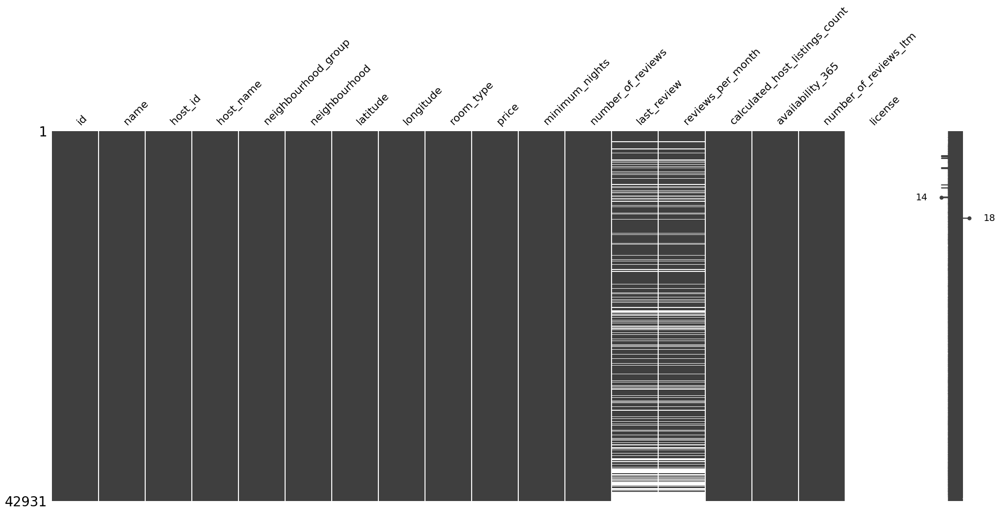

In [8]:
msno.matrix(df)

In [9]:
df.isna().sum()

id                                    0
name                                 12
host_id                               0
host_name                             5
neighbourhood_group                   0
neighbourhood                         0
latitude                              0
longitude                             0
room_type                             0
price                                 0
minimum_nights                        0
number_of_reviews                     0
last_review                       10304
reviews_per_month                 10304
calculated_host_listings_count        0
availability_365                      0
number_of_reviews_ltm                 0
license                           42930
dtype: int64

- **We can see that Maximum amount of NaN values present in the License Column, so that column will be dropped.**

In [10]:
# ALso dropping host_id and id because these are not needed 

drop_col = ['host_id','id','license']
df = df.drop(columns = drop_col)
df.head()

,name,host_name,neighbourhood_group,neighbourhood,latitude,longitude,room_type,price,minimum_nights,number_of_reviews,last_review,reviews_per_month,calculated_host_listings_count,availability_365,number_of_reviews_ltm
0,Skylit Midtown Castle,Jennifer,Manhattan,Midtown,40.75356,-73.98559,Entire home/apt,150,30,49,2022-06-21,0.30,3,314,1
1,BlissArtsSpace!,Garon,Brooklyn,Bedford-Stuyvesant,40.68535,-73.95512,Private room,60,30,50,2019-12-02,0.30,2,365,0
2,Cozy Clean Guest Room - Family Apt,MaryEllen,Manhattan,Upper West Side,40.80380,-73.96751,Private room,75,2,118,2017-07-21,0.72,1,0,0
3,Large Furnished Room Near B'way,Shunichi,Manhattan,Midtown,40.76457,-73.98317,Private room,68,2,575,2023-02-19,3.41,1,106,52
4,"Large Sunny Brooklyn Duplex, Patio + Garden",Rebecca,Brooklyn,Sunset Park,40.66265,-73.99454,Entire home/apt,275,60,3,2022-08-10,0.03,1,181,1


In [11]:
# Filling the NaN values with mode 
df.reviews_per_month.mode()

0    0.02
Name: reviews_per_month, dtype: float64

In [12]:
df.reviews_per_month = df.reviews_per_month.fillna(0.02)

In [13]:
df.isna().sum()

# Keeping last_review for further analysis

name                                 12
host_name                             5
neighbourhood_group                   0
neighbourhood                         0
latitude                              0
longitude                             0
room_type                             0
price                                 0
minimum_nights                        0
number_of_reviews                     0
last_review                       10304
reviews_per_month                     0
calculated_host_listings_count        0
availability_365                      0
number_of_reviews_ltm                 0
dtype: int64

## 2. Handling Duplicate Values

In [14]:
df.duplicated().any()

True

In [15]:
# Checking the number of dupliate rows
df[df.duplicated()].shape

(10, 15)

In [16]:
df = df.drop_duplicates()

In [17]:
df.shape

(42921, 15)

## 3. Handling the Datatypes

In [18]:
df.dtypes

name                               object
host_name                          object
neighbourhood_group                object
neighbourhood                      object
latitude                          float64
longitude                         float64
room_type                          object
price                               int64
minimum_nights                      int64
number_of_reviews                   int64
last_review                        object
reviews_per_month                 float64
calculated_host_listings_count      int64
availability_365                    int64
number_of_reviews_ltm               int64
dtype: object

In [19]:
df['last_review'].unique()

array(['2022-06-21', '2019-12-02', '2017-07-21', ..., '2022-02-23',
       '2022-03-10', '2022-03-18'], dtype=object)

In [20]:
# Converting object to datetime64[ns]
df['last_review'] = pd.to_datetime(df['last_review'])

In [21]:
# Creating the 'year' column for analysis
df['year'] = df['last_review'].dt.year
df['year'].unique()

array([2022., 2019., 2017., 2023., 2021.,   nan, 2020., 2011., 2013.,
       2014., 2018., 2016., 2015., 2012.])

In [22]:
df.dtypes
# year in float because of NaN values

name                                      object
host_name                                 object
neighbourhood_group                       object
neighbourhood                             object
latitude                                 float64
longitude                                float64
room_type                                 object
price                                      int64
minimum_nights                             int64
number_of_reviews                          int64
last_review                       datetime64[ns]
reviews_per_month                        float64
calculated_host_listings_count             int64
availability_365                           int64
number_of_reviews_ltm                      int64
year                                     float64
dtype: object

In [23]:
df.drop(columns = 'last_review',axis=1)

,name,host_name,neighbourhood_group,neighbourhood,latitude,longitude,room_type,price,minimum_nights,number_of_reviews,reviews_per_month,calculated_host_listings_count,availability_365,number_of_reviews_ltm,year
0,Skylit Midtown Castle,Jennifer,Manhattan,Midtown,40.753560,-73.985590,Entire home/apt,150,30,49,0.30,3,314,1,2022.0
1,BlissArtsSpace!,Garon,Brooklyn,Bedford-Stuyvesant,40.685350,-73.955120,Private room,60,30,50,0.30,2,365,0,2019.0
2,Cozy Clean Guest Room - Family Apt,MaryEllen,Manhattan,Upper West Side,40.803800,-73.967510,Private room,75,2,118,0.72,1,0,0,2017.0
3,Large Furnished Room Near B'way,Shunichi,Manhattan,Midtown,40.764570,-73.983170,Private room,68,2,575,3.41,1,106,52,2023.0
4,"Large Sunny Brooklyn Duplex, Patio + Garden",Rebecca,Brooklyn,Sunset Park,40.662650,-73.994540,Entire home/apt,275,60,3,0.03,1,181,1,2022.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
42926,bright studio in Williamsburg,Jean,Brooklyn,Williamsburg,40.718976,-73.963985,Entire home/apt,76,7,0,0.02,1,8,0,NaN
42927,Room in the heart of LES with Gym& Rooftop BBQ,Charlene,Manhattan,East Village,40.721703,-73.981473,Private room,32,30,0,0.02,5,79,0,NaN
42928,Fantastic 3BD apt in Brooklyn,Jose,Brooklyn,Bushwick,40.688700,-73.907650,Entire home/apt,127,3,0,0.02,8,356,0,NaN
42929,The Coziest Home,Remmy,Staten Island,Bull's Head,40.616911,-74.164652,Entire home/apt,280,1,0,0.02,1,87,0,NaN


The **describe()** function is used to provide a set of descriptive statistics, which include measures such as the count, mean, standard deviation, minimum, 25th percentile (Q1), median (50th percentile), 75th percentile (Q3), and maximum.

In [24]:
df.describe()

,latitude,longitude,price,minimum_nights,number_of_reviews,reviews_per_month,calculated_host_listings_count,availability_365,number_of_reviews_ltm,year
count,42921.000000,42921.000000,42921.000000,42921.000000,42921.000000,42921.000000,42921.000000,42921.000000,42921.000000,32626.000000
mean,40.728267,-73.943658,200.189651,18.115165,25.862002,0.893419,24.057082,140.255865,7.738310,2021.225955
std,0.057646,0.056631,895.147544,27.464470,56.621574,1.635675,80.877199,141.994403,18.292005,2.289809
min,40.500314,-74.251907,0.000000,1.000000,0.000000,0.010000,1.000000,0.000000,0.000000,2011.000000
25%,40.687480,-73.981750,75.000000,2.000000,1.000000,0.020000,1.000000,0.000000,0.000000,2020.000000
50%,40.724020,-73.952600,125.000000,7.000000,5.000000,0.240000,1.000000,89.000000,1.000000,2022.000000
75%,40.762298,-73.924020,200.000000,30.000000,24.000000,1.170000,4.000000,289.000000,7.000000,2023.000000
max,40.911380,-73.710870,99000.000000,1250.000000,1842.000000,86.610000,526.000000,365.000000,1093.000000,2023.000000


# Data Visualization
- Data Visualization refers to graphical representation of data with the help of bar charts, pie charts, line graphs, heatmaps, geographical maps etc.

## Hosting Listings Count by Room Types 

In [25]:
listings_room = df.groupby('room_type')['calculated_host_listings_count'].sum()
listings_room

room_type
Entire home/apt    555985
Hotel room           2809
Private room       471145
Shared room          2615
Name: calculated_host_listings_count, dtype: int64

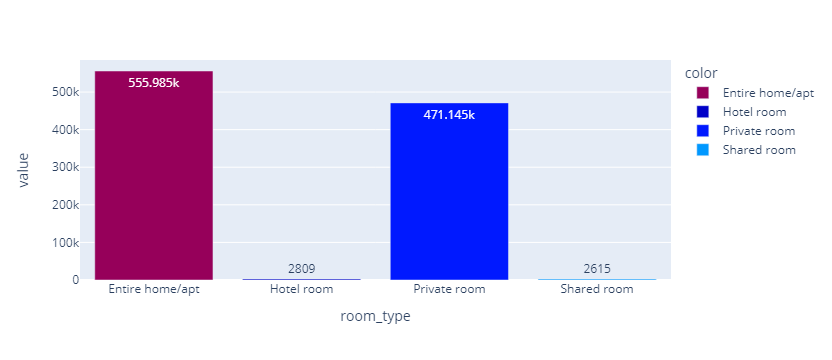

In [26]:
bar_listings_room = px.bar(data_frame = listings_room,
                          color = ['Entire home/apt','Hotel room','Private room','Shared room'],
                          color_discrete_sequence = px.colors.sequential.Rainbow, 
                          text_auto = True)
bar_listings_room.show()

### Hosting Listings Count by Neighbourhood Locations

In [27]:
listings_neighb = df.groupby('neighbourhood_group')['calculated_host_listings_count'].sum()
listings_neighb

neighbourhood_group
Bronx              5103
Brooklyn         229209
Manhattan        645602
Queens           151472
Staten Island      1168
Name: calculated_host_listings_count, dtype: int64

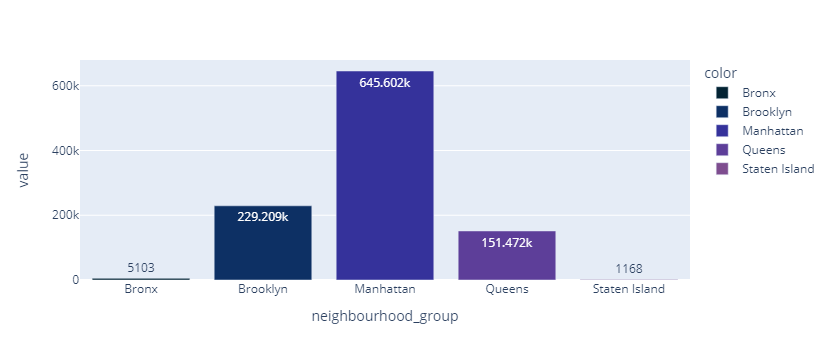

In [28]:
bar_listings_neighb = px.bar(data_frame = listings_neighb,
                          color = ['Bronx','Brooklyn','Manhattan','Queens','Staten Island'],
                          color_discrete_sequence = px.colors.sequential.thermal, 
                          text_auto = True)
bar_listings_neighb.show()

### Price Distribution by Room Type

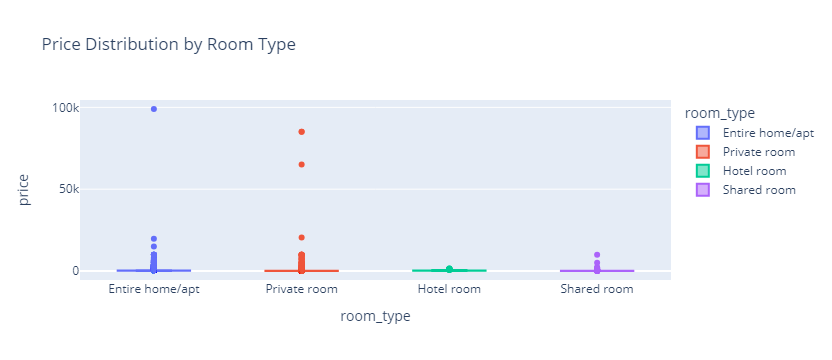

In [29]:
box_price_room = px.box(data_frame = df,
                         x = df['room_type'],
                         y = df['price'],
                       color = 'room_type',
                       title = 'Price Distribution by Room Type')
box_price_room.show()

### Price Distribution by Neighbourhood Groups

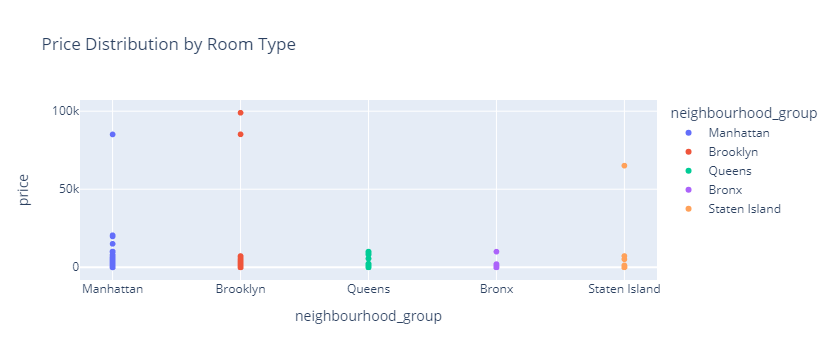

In [30]:
scatter_price_neighb = px.scatter(data_frame = df,
                            x = df['neighbourhood_group'],
                            y = df['price'],
                            color = 'neighbourhood_group',
                            title = 'Price Distribution by Room Type')
scatter_price_neighb.show()

### HeatMap

In [31]:
corr_table = df[['price','minimum_nights','number_of_reviews','reviews_per_month','calculated_host_listings_count',
                 'availability_365','number_of_reviews_ltm']].corr()
corr_table

,price,minimum_nights,number_of_reviews,reviews_per_month,calculated_host_listings_count,availability_365,number_of_reviews_ltm
price,1.000000,-0.020675,-0.016406,-0.009522,0.026185,0.027153,-0.008535
minimum_nights,-0.020675,1.000000,-0.138867,-0.240618,0.119949,-0.092412,-0.216611
number_of_reviews,-0.016406,-0.138867,1.000000,0.610516,-0.111158,0.046174,0.652936
reviews_per_month,-0.009522,-0.240618,0.610516,1.000000,-0.120731,0.138872,0.858727
calculated_host_listings_count,0.026185,0.119949,-0.111158,-0.120731,1.000000,0.126450,-0.097346
availability_365,0.027153,-0.092412,0.046174,0.138872,0.126450,1.000000,0.122662
number_of_reviews_ltm,-0.008535,-0.216611,0.652936,0.858727,-0.097346,0.122662,1.000000


<Axes: >

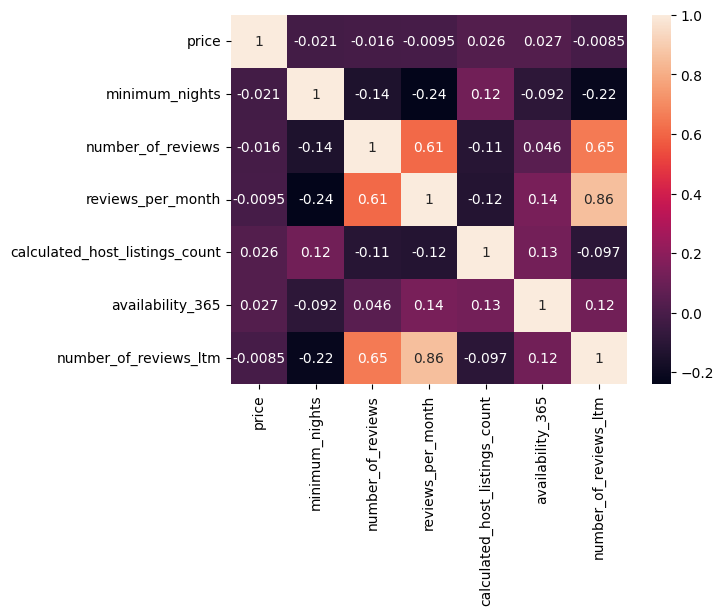

In [32]:
heat_map = sns.heatmap(data = corr_table, annot = True)
heat_map

### Geographical Map

In [33]:
pio.templates.default = "plotly_dark"

In [34]:
location = df[['latitude','longitude','neighbourhood_group']]
location

,latitude,longitude,neighbourhood_group
0,40.753560,-73.985590,Manhattan
1,40.685350,-73.955120,Brooklyn
2,40.803800,-73.967510,Manhattan
3,40.764570,-73.983170,Manhattan
4,40.662650,-73.994540,Brooklyn
...,...,...,...
42926,40.718976,-73.963985,Brooklyn
42927,40.721703,-73.981473,Manhattan
42928,40.688700,-73.907650,Brooklyn
42929,40.616911,-74.164652,Staten Island


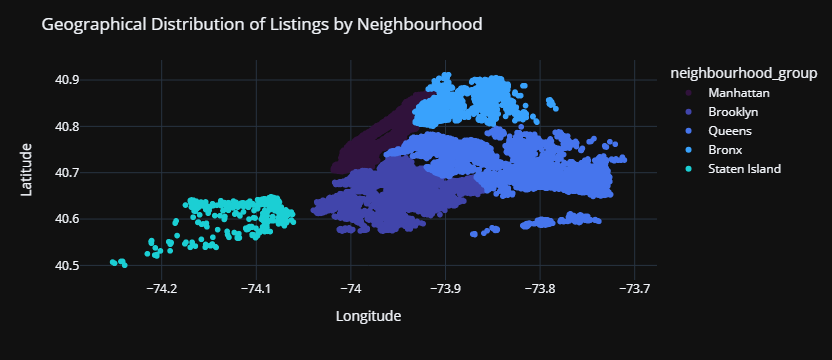

In [35]:
geo_map = px.scatter(location, x = "longitude", y = "latitude", color = "neighbourhood_group", 
                     color_discrete_sequence = px.colors.sequential.Turbo )

# Add a title and labels
geo_map.update_layout(title = "Geographical Distribution of Listings by Neighbourhood",
                  xaxis_title = "Longitude",
                  yaxis_title = "Latitude")

# Show the plot
geo_map.show()

###  Mean Price Distribution by Neighbourhood Groups and Room Types 

In [36]:
av_price_room = df.groupby("room_type")["price"].mean()
df_av_room = pd.DataFrame(av_price_room).reset_index()
column_names = ["room_type", "price"]
df_av_room.columns = column_names
df_av_room

,room_type,price
0,Entire home/apt,249.255365
1,Hotel room,309.959391
2,Private room,134.696234
3,Shared room,126.250000


In [37]:
av_price_neighb = df.groupby("neighbourhood_group")["price"].mean()
df_av_neighb = pd.DataFrame(av_price_neighb).reset_index()
column_names = ["neighbourhood_group", "price"]
df_av_neighb.columns = column_names
df_av_neighb

,neighbourhood_group,price
0,Bronx,117.512123
1,Brooklyn,162.766829
2,Manhattan,268.118540
3,Queens,128.173655
4,Staten Island,309.037296


Text(0, 0.5, 'Average Price')

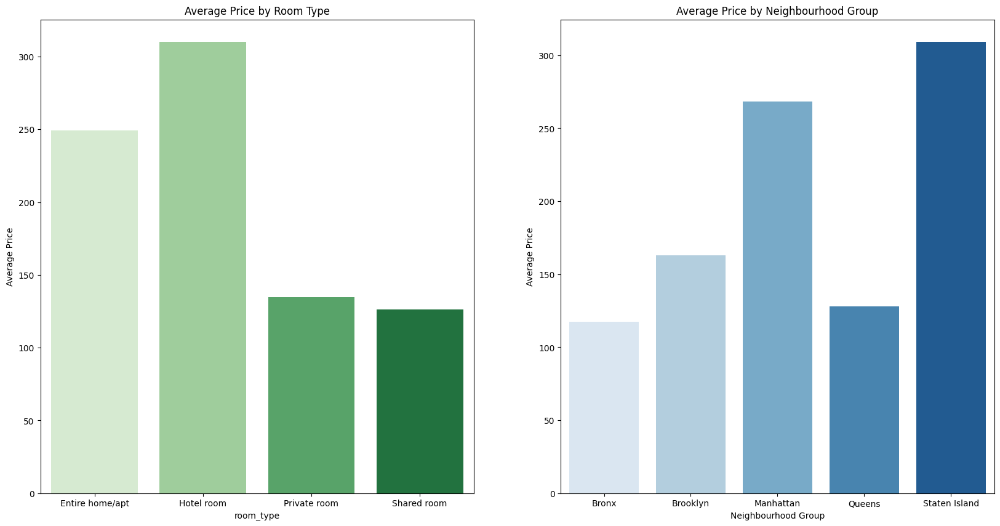

In [38]:
# Making subplots 
# figsize represents adjusts the size of the figure
# ax1, ax2 reprsents tupel that contains two subplots
fig, (ax1, ax2) = plt.subplots(1, 2, figsize = (20, 10))

# Average price by room type
# Creating a bar plot
sns.barplot(data = df_av_room, x = df_av_room["room_type"],
            y = df_av_room["price"], 
            ax = ax1, palette="Greens",
            label="Average Price by Room Type")

ax1.set_title("Average Price by Room Type")
ax1.set_ylabel("Average Price")

# Average price by neighbourhood group
# Creating a bar plot
sns.barplot(data = df_av_neighb, x = "neighbourhood_group", y = "price", 
            ax = ax2, palette = "Blues",
            label = "Average Price by Neighbourhood Group")

ax2.set_title("Average Price by Neighbourhood Group")
ax2.set_xlabel("Neighbourhood Group")
ax2.set_ylabel("Average Price")


### Number of reviews by Room Type and Neighbourhood Locations

In [39]:
rev_room_type = df.groupby("room_type")["number_of_reviews"].sum()
df_rev_room_type = pd.DataFrame(rev_room_type).reset_index()
column_names = ["room_type", "number_of_reviews"]
df_rev_room_type.columns = column_names
df_rev_room_type

,room_type,number_of_reviews
0,Entire home/apt,645605
1,Hotel room,10292
2,Private room,442186
3,Shared room,11940


In [40]:
rev_neighb = df.groupby("neighbourhood_group")["number_of_reviews"].sum()
df_rev_neighb = pd.DataFrame(rev_neighb).reset_index()
column_names = ["neighbourhood_group", "number_of_reviews"]
rev_neighb.columns = column_names
df_rev_neighb

,neighbourhood_group,number_of_reviews
0,Bronx,43047
1,Brooklyn,466643
2,Manhattan,376780
3,Queens,208344
4,Staten Island,15209


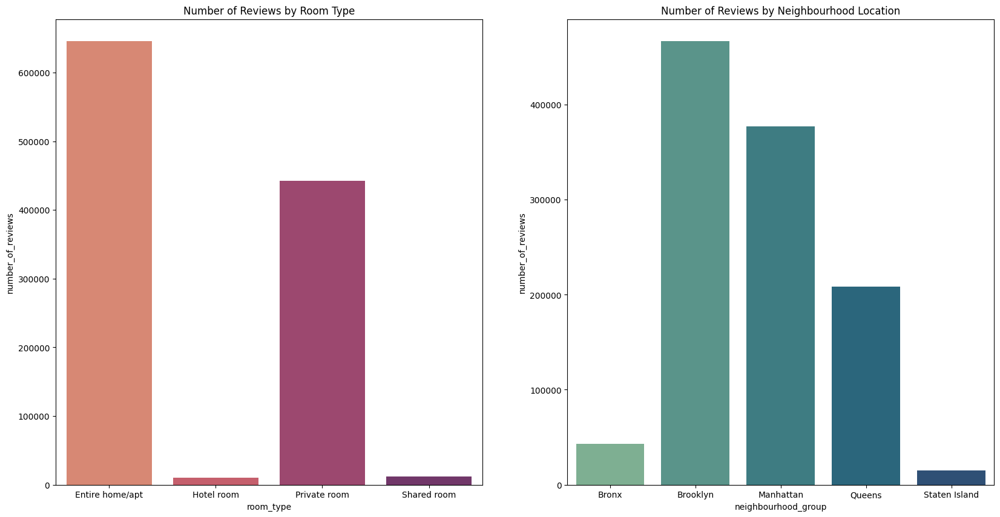

In [41]:
fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(20, 10))
sns.barplot(data=df_rev_room_type, x="room_type", y="number_of_reviews", ax=ax1, palette = 'flare')
ax1.set_title("Number of Reviews by Room Type")

sns.barplot(data=df_rev_neighb, x="neighbourhood_group", y="number_of_reviews", ax=ax2, palette = 'crest')
ax2.set_title("Number of Reviews by Neighbourhood Location")

plt.show()


### Availability of Rooms

In [42]:
room_365 = df.groupby('room_type')['availability_365'].sum()
room_365

room_type
Entire home/apt    3468510
Hotel room           40942
Private room       2417111
Shared room          93359
Name: availability_365, dtype: int64

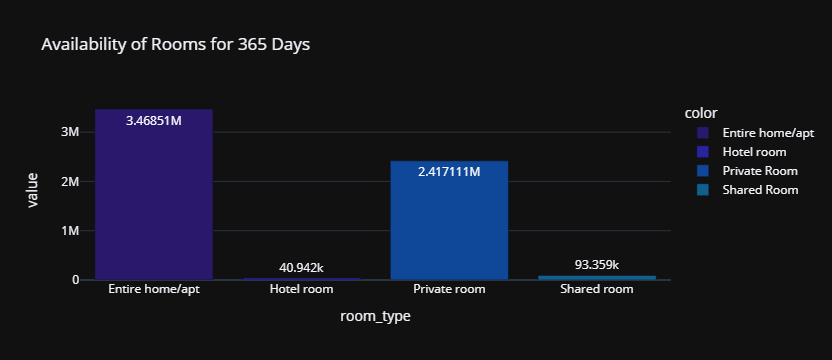

In [43]:
col = ['Entire home/apt', 'Hotel room','Private Room', 'Shared Room']
bar_room_365 = px.bar(data_frame = room_365,
                     color = col,
                     title = 'Availability of Rooms for 365 Days',
                     text_auto = True,
                     color_discrete_sequence = px.colors.sequential.haline)
bar_room_365.show()

### Price by Year  

In [44]:
price_year = df.groupby("year")["price"].sum()
df_price_year = pd.DataFrame(price_year).reset_index()
column_names = ["year", "price"]
df_price_year.columns = column_names
df_price_year

,year,price
0,2011.0,844
1,2012.0,1696
2,2013.0,6430
3,2014.0,16068
4,2015.0,127204
5,2016.0,191224
6,2017.0,155581
7,2018.0,204155
8,2019.0,338396
9,2020.0,380013


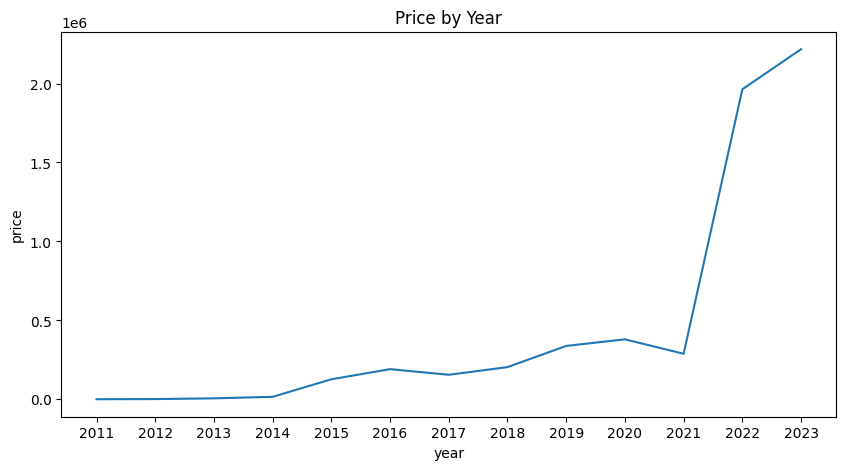

In [45]:
plt.figure(figsize=(10, 5))

ax = sns.lineplot(data=df_price_year, x="year", y="price")
ax.set_xticks(list(range(2011, 2024)))

plt.rcParams["figure.figsize"] = (10, 4)

plt.title("Price by Year")
plt.show()


### Host Listings by Year


In [46]:
host_year = df.groupby("year")["calculated_host_listings_count"].sum()
df_host_year = pd.DataFrame(host_year).reset_index()
column_names = ["year", "host listings"]
df_host_year.columns = column_names
df_host_year

,year,host listings
0,2011.0,32
1,2012.0,16
2,2013.0,33
3,2014.0,112
4,2015.0,898
5,2016.0,1764
6,2017.0,2238
7,2018.0,2855
8,2019.0,12653
9,2020.0,19224


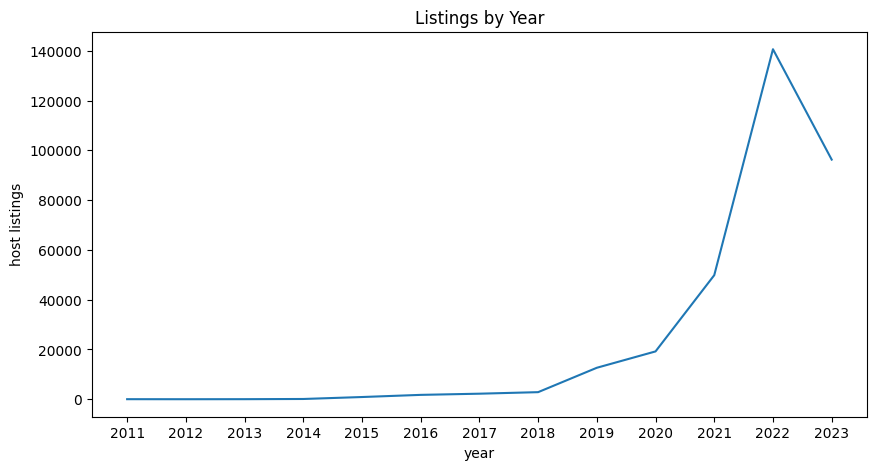

In [47]:
plt.figure(figsize=(10, 5))

ax = sns.lineplot(data=df_host_year, x="year", y="host listings")
ax.set_xticks(list(range(2011, 2024)))

plt.title("Listings by Year")
plt.show()


### Top Five Listings by Host names

In [48]:
host_list = df.groupby('host_name')['calculated_host_listings_count'].sum().sort_values(ascending = False)[:5]
host_list

host_name
Blueground    276676
Eugene        155242
RoomPicks     127313
June           49300
Hiroki         42849
Name: calculated_host_listings_count, dtype: int64

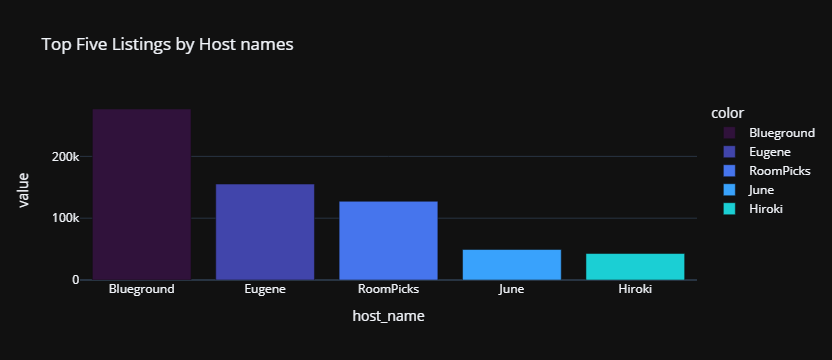

In [49]:
name = ['Blueground','Eugene','RoomPicks','June','Hiroki']
bar_host_list = px.bar(data_frame = host_list,
                       color = name,
                       title = 'Top Five Listings by Host names',
                      color_discrete_sequence = px.colors.sequential.Turbo)
bar_host_list.show()

# WordCloud for Host Names

In [50]:
pio.templates.default = "plotly_white"

In [51]:
names = ' '.join(df['host_name'].astype(str))

In [52]:
# WordCloud() is a class used to generate word clouds
# generate() takes list of words as input to generate the word cloud
wordcloud = WordCloud(width = 800, height = 400, background_color ='black').generate(names)

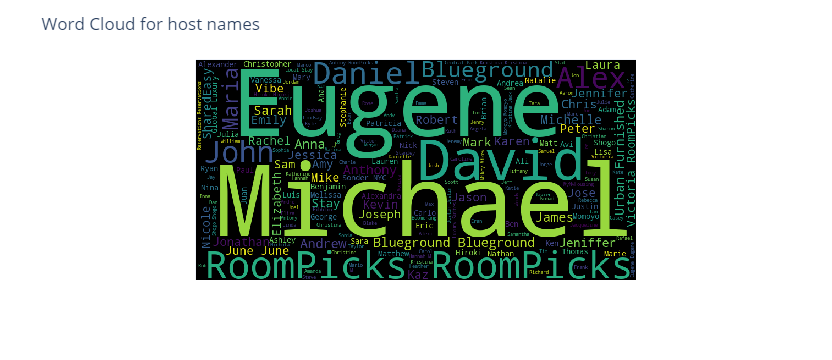

In [53]:
# imshow() is used to display the wordcloud
fig = px.imshow(wordcloud.to_array())
fig.update_layout(title_text='Word Cloud for host names')
# showticklabels specify whether tick labels should be shown or not
fig.update_xaxes(showticklabels = False)  
fig.update_yaxes(showticklabels = False)
fig.show()